Sistemas Inteligntes - IF684EC
# Miniprojeto K Means / K Medoids

<p align="justify">
O projeto tem como objetivo introduzir a implementação de modelos de classificação não supervisionados, assim cono analisar o impacto de cada parâmetro no resultado final. Iremos analisar os algoritmos KMeans e KMedoids

### Equipe:
> Jeferson Severino de Araújo (jsa2)

> Lucas Nascimento Brandão (lnb)

> Matheus Julío Boncsidai de Oliveira (mjbo)

> Pedro Henrique Almeida Girão Peixinho (phagp)

> Victor Gabriel de Carvalho (vgc3)



---



---



---



## Dataset - U.S. News and World Report’s College Data

<p align="justify">
Conjunto de Dados Dados da Faculdade de Notícias dos EUA e do Relatório Mundial. O datset é composto de 777 observações sobre as 18 variáveis a seguir:

> Private: Um fator com níveis Não e Sim indicando universidade privada ou pública

> Apps: Número de aplicações recebidas

> Accept: Número de inscrições aceitas

> Enroll: Número de novos alunos matriculados

> Top10perc: Pct. novos alunos dos 10% melhores do H.S. aula

> Top25perc: Pct. novos alunos dos 25% melhores do H.S. aula

> F.Undergrad: Número de alunos de graduação em período integral

> P.Undergrad: Número de alunos de graduação em meio período

> Outstate: mensalidades fora do estado

> Room.Board: Custos de hospedagem e alimentação

> Books: custos estimados do livro

> Personal: gastos pessoais estimados

> PhD: Pct. do corpo docente com doutorado

> Terminal: Pct. do corpo docente com grau terminal

> S.F.Ratio: Proporção aluno/professor

> perc.alunos: Pct. ex-alunos que doam

> Expend: Despesas instrucionais por aluno

> Grad.Rate: Taxa de graduação

<p align="justify">
Este conjunto de dados foi retirado da biblioteca StatLib, mantida na Carnegie Mellon University. Usaremos esse dataset para prever se uma dada universidade americana é pública ou particular.



---



---



---



## Implementação

### Imports

<p align="justify">
Primeiramente, algumas bibliotecas precisam ser instaladas, já que não vêm previamente no ambiente do Colab.

In [1]:
!pip install scikit-learn-extra &> /dev/null
!pip install -U kaleido

<p align="justify">
Será necessário o uso da biblioteca Pandas para uma melhor manipulação e tratamento dos dados, Matplotlib e Plotly para melhor visualização e Numpy para algumas operações matemáticas.

Ademais, utilizaremos os seguintes módulos SKLearn:

> KMeans e KMedoids, que serão nossos modelos de algoritmos não supervisionados

> davies_bouldin_score / silhouette_score / calinski_harabasz_score, para analisarmos a melhor quantidade de clusters.

> classification_report / confusion_matrix, para imprimir as métricas detalhadas

<p align="justify">
Ademais, usaremos o Scipy para algumas orerações e o Seaborn para visualização gráfica.

A utilização de cada uma será explicitada posteriormente.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "colab+pdf"

from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import davies_bouldin_score, silhouette_score, calinski_harabasz_score

from scipy.spatial.distance import cdist

import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).




---



---



### Data Exploration

Primeiramente, iremos percorrer o dataset, verificando relações e observando se ha algum tipo de problema que devemos corrigir.

In [3]:
dataset = pd.read_csv("/content/gdrive/MyDrive/Sistemas Inteligentes/Miniprojeto KMeans/College.csv")
#dataset = pd.read_csv("College.csv")

dataset.shape

(777, 19)

In [4]:
dataset.head()  # Mostra as primeiras cinco amostras do dataset.

,Unnamed: 0,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Abilene Christian University,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Adelphi University,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Adrian College,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Agnes Scott College,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Alaska Pacific University,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [5]:
dataset.sample(10)  # Mostra n amostras aleatórias

,Unnamed: 0,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
757,Whitworth College,Yes,1121,926,372,43,70,1270,160,12660,4500,678,2424,80,80,16.9,20,8328,80
332,Lynchburg College,Yes,1756,1500,366,3,21,1524,280,12450,5400,450,870,62,66,12.4,24,8832,70
585,Texas Southern University,No,4345,3245,2604,15,85,5584,3101,7860,3360,600,1700,65,75,18.2,21,3605,10
653,University of North Carolina at Greensboro,No,5191,4134,1500,15,44,7532,1847,8677,3505,600,1300,75,94,15.5,17,7392,53
356,McKendree College,Yes,1002,555,119,16,43,836,684,7680,3740,500,800,70,74,17.7,21,6652,52
624,University of Illinois at Chicago,No,8384,5727,2710,22,50,13518,2916,7230,5088,630,3228,82,84,10.0,6,13883,34
260,Hope College,Yes,1712,1483,624,37,69,2505,208,12275,4341,465,1100,72,81,12.5,40,9284,72
26,Assumption College,Yes,2135,1700,491,23,59,1708,689,12000,5920,500,500,93,93,13.8,30,7100,88
375,Mississippi State University,No,4255,3277,1609,18,57,10094,1621,9866,3084,480,1479,77,77,15.9,20,6223,53
83,Canisius College,Yes,2853,2193,753,16,34,2978,434,10750,5340,400,1130,90,92,14.6,26,7972,64


<p align="justify">
O código abaixo cria um conjunto de gráficos de histograma para visualizar a frequência da distribuição de dados em cada uma das colunas do dataset. Esses gráficos são úteis para entender a distribuição dos dados e podem ajudar a identificar tendências, outliers e outras características dos seus dados.

> <p align="justify">
Foram excuídas as três primeiras colunas, já que a primeira possui apenas valores únicos, a segunda são os labels de classificação e a terceira foi retirada para melhor visualização.



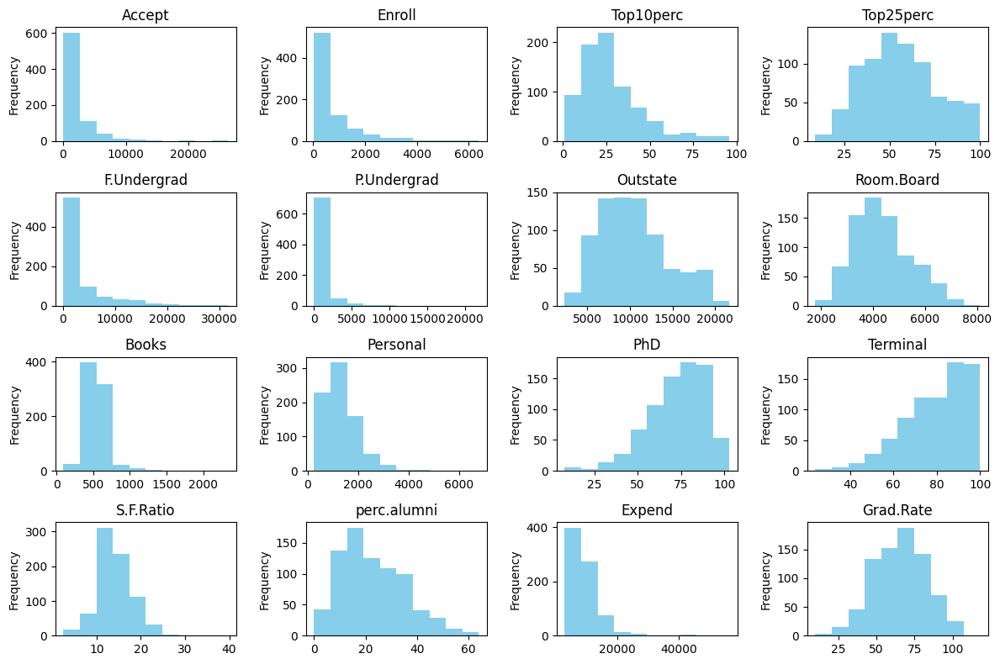

In [6]:
columns = dataset.columns[3:]
fig, axes = plt.subplots(nrows=4, ncols=len(columns)//4, figsize=(12, 8))

for i, col in enumerate(columns):
    dataset[col].plot(kind='hist', ax=axes[i // (len(columns)//4)][i % (len(columns) // 4)], bins=10, color='skyblue')
    axes[i // (len(columns)//4)][i % (len(columns) // 4)].set_title(col)

plt.tight_layout()
plt.show()

<p align="justify">
O gráfico a seguir mostra a quantidade de elementos de cada classe alvo (Pública ou Privada). Percebe-se que existem muito mais amostras de universidades privadas, o que já é de se esperar no contexto do ensino superior norte americano.

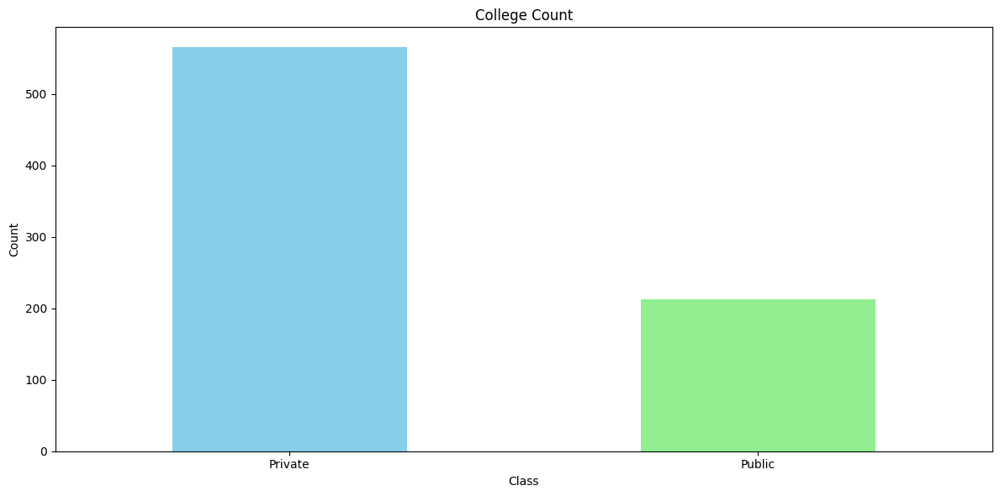

In [7]:
plt.figure(figsize=(12, 6))

dataset['Private'].value_counts().plot(kind='bar', color=['skyblue', 'lightgreen'])
plt.title('College Count')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks([0, 1], ['Private', 'Public'], rotation=0)

plt.tight_layout()
plt.show()

<p align="justify">
A seguir mostraremos a relação 2 a 2 entre alguns atributos numéricos que pareceram relevantes de se comparar. Com esses gráficos Scatter, podemos ver que, em alguns valores, é clara a distinção entre as duas categorias.

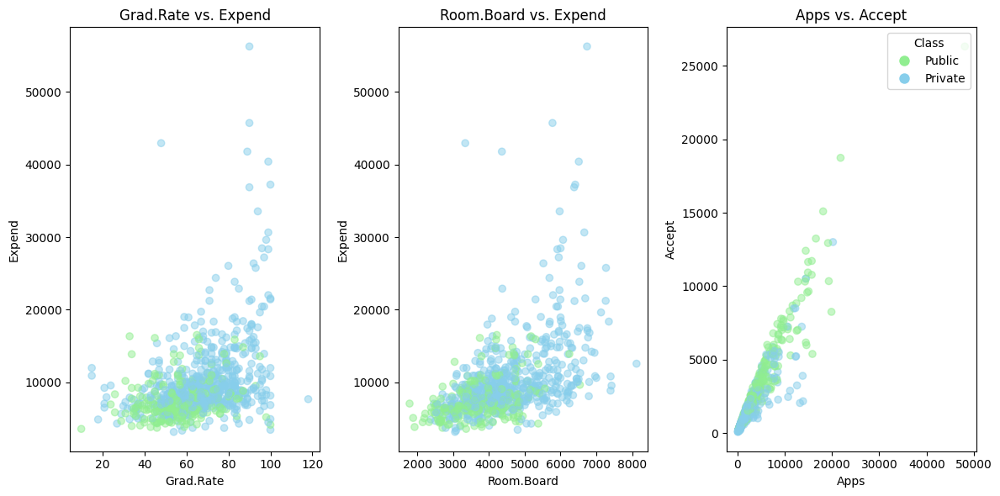

In [8]:
colors = dataset['Private'].replace({'No': 0, 'Yes':1})
num_colors = 256
c_range = ['lightgreen'] + [mcolors.to_rgba('skyblue', i / num_colors) for i in range(1, num_colors - 1)] + ['skyblue']
cmap = mcolors.ListedColormap(c_range)

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.scatter(dataset['Grad.Rate'], dataset['Expend'], c=colors, cmap=cmap, alpha=0.5)
plt.title('Grad.Rate vs. Expend')
plt.xlabel('Grad.Rate')
plt.ylabel('Expend')

plt.subplot(1, 3, 2)
plt.scatter(dataset['Room.Board'], dataset['Expend'], c=colors, cmap=cmap, alpha=0.5)
plt.title('Room.Board vs. Expend')
plt.xlabel('Room.Board')
plt.ylabel('Expend')

plt.subplot(1, 3, 3)
plt.scatter(dataset['Apps'], dataset['Accept'], c=colors, cmap=cmap, alpha=0.5)
plt.title('Apps vs. Accept')
plt.xlabel('Apps')
plt.ylabel('Accept')

legend_labels = ['Public', 'Private']
c_range = ['lightgreen'] + [mcolors.to_rgba('skyblue', i / (len(legend_labels) - 1)) for i in range(1, len(legend_labels))]
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=color, markersize=10) for label, color in zip(legend_labels, c_range)]
plt.legend(handles=legend_handles, title='Class', loc='upper right')

plt.tight_layout()
plt.show()



---



---



### Data Cleaning

<p align="justify">
Agora que analisamos o dataset, precisamos fazer uma limpeza nos dados, eliminando valores irrelevantes ou que possam prejudicar o modelo. No nosso caso, iremos remover as informações de nome que se tratam de valores únicos e sem importância estatística, que não ajudam em nosso problerma de decisão. Também trocaremos os valores textuais "Yes" / "No" das classes para valores numericos (1 e 0).

In [9]:
dataset.isnull().sum()  # Checando se há valores nulos

Unnamed: 0     0
Private        0
Apps           0
Accept         0
Enroll         0
Top10perc      0
Top25perc      0
F.Undergrad    0
P.Undergrad    0
Outstate       0
Room.Board     0
Books          0
Personal       0
PhD            0
Terminal       0
S.F.Ratio      0
perc.alumni    0
Expend         0
Grad.Rate      0
dtype: int64

In [10]:
dataset.dtypes  # Checando se há tipos inconsistentes

Unnamed: 0      object
Private         object
Apps             int64
Accept           int64
Enroll           int64
Top10perc        int64
Top25perc        int64
F.Undergrad      int64
P.Undergrad      int64
Outstate         int64
Room.Board       int64
Books            int64
Personal         int64
PhD              int64
Terminal         int64
S.F.Ratio      float64
perc.alumni      int64
Expend           int64
Grad.Rate        int64
dtype: object

In [11]:
dataset.drop(['Unnamed: 0'], axis=1, inplace=True)  # Removnendo atributo irrelevante

dataset.head()

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [12]:
dataset['Private'].replace({'No': 0, 'Yes':1}, inplace=True)  # Convertendo valores categóricos

dataset.head()

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,1,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,1,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,1,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,1,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


<p align="justify">
Agora que a label passou a ser numérica, podemos ver a correlação entre todos. Atributos com correlação muito alta entre si (sempecialmente se envolver o label alvo) podem prejuducar o modelo. No nosso caso, como mostrado abaixo, não há nenhuma correlação muito elevada.

In [13]:
dataset.corr(numeric_only=True)  # Vendo a correlação entre atributos

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Private,1.000000,-0.432095,-0.475252,-0.567908,0.164132,0.095752,-0.615561,-0.452088,0.552650,0.340532,-0.018549,-0.304485,-0.156714,-0.129620,-0.472205,0.414775,0.258461,0.336162
Apps,-0.432095,1.000000,0.943451,0.846822,0.338834,0.351640,0.814491,0.398264,0.050159,0.164939,0.132559,0.178731,0.390697,0.369491,0.095633,-0.090226,0.259592,0.146755
Accept,-0.475252,0.943451,1.000000,0.911637,0.192447,0.247476,0.874223,0.441271,-0.025755,0.090899,0.113525,0.200989,0.355758,0.337583,0.176229,-0.159990,0.124717,0.067313
Enroll,-0.567908,0.846822,0.911637,1.000000,0.181294,0.226745,0.964640,0.513069,-0.155477,-0.040232,0.112711,0.280929,0.331469,0.308274,0.237271,-0.180794,0.064169,-0.022341
Top10perc,0.164132,0.338834,0.192447,0.181294,1.000000,0.891995,0.141289,-0.105356,0.562331,0.371480,0.118858,-0.093316,0.531828,0.491135,-0.384875,0.455485,0.660913,0.494989
Top25perc,0.095752,0.351640,0.247476,0.226745,0.891995,1.000000,0.199445,-0.053577,0.489394,0.331490,0.115527,-0.080810,0.545862,0.524749,-0.294629,0.417864,0.527447,0.477281
F.Undergrad,-0.615561,0.814491,0.874223,0.964640,0.141289,0.199445,1.000000,0.570512,-0.215742,-0.068890,0.115550,0.317200,0.318337,0.300019,0.279703,-0.229462,0.018652,-0.078773
P.Undergrad,-0.452088,0.398264,0.441271,0.513069,-0.105356,-0.053577,0.570512,1.000000,-0.253512,-0.061326,0.081200,0.319882,0.149114,0.141904,0.232531,-0.280792,-0.083568,-0.257001
Outstate,0.552650,0.050159,-0.025755,-0.155477,0.562331,0.489394,-0.215742,-0.253512,1.000000,0.654256,0.038855,-0.299087,0.382982,0.407983,-0.554821,0.566262,0.672779,0.571290
Room.Board,0.340532,0.164939,0.090899,-0.040232,0.371480,0.331490,-0.068890,-0.061326,0.654256,1.000000,0.127963,-0.199428,0.329202,0.374540,-0.362628,0.272363,0.501739,0.424942




---



---



### Data Split

Separando o dataset em X e y.

In [14]:
y = dataset['Private']  # Label
X = dataset.drop(['Private'], axis=1)  # Atributos

y.shape, X.shape

((777,), (777, 17))

In [15]:
y.sample(5)

1      1
93     1
544    1
494    1
220    1
Name: Private, dtype: int64

In [16]:
X.sample(5)

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
612,681,588,246,44,74,1058,73,10760,6230,500,1200,85,93,13.4,26,8731,63
649,9750,7640,2529,24,62,10358,1338,11180,3862,650,2450,89,87,17.5,16,7855,75
330,1549,1392,587,38,72,2269,85,13240,3560,600,400,73,85,13.8,38,8949,77
581,14474,10519,6392,49,85,31643,2798,5130,3412,600,2144,89,91,23.1,29,8471,69
240,1709,1385,634,36,72,2281,50,14125,3600,400,700,79,89,12.5,58,9907,80




---



---



### Modelos

<p align="justify">
Agora, vamos testar os algorítmos KMeans e KMedoids em diversos modelos, com diferentes atributos e comparar os resultados obtidos. Utilizaremos o random_state com um valor arbitrário, para manter a constância entre os testes.

> <p align="justify">
Para cada algoritmo, prmeiramente definiremos os parâmetros que serão utilizados no método. Posteriormente, usaremos as métricas elbow method, Calinski-Harabasz, Davies-Bouldin, Silhouette e BIC para indicar o melhor valor de clustes (k) para resolver o problema.


#### KMeans

<p align="justify">
sklearn.cluster.KMeans(n_clusters=8, *, init='k-means++', n_init='warn',max_iter=300, tol=0.0001, verbose=0, random_state=None, copy_x=True, algorithm='lloyd')

In [17]:
kmeans_0 = KMeans(n_init='auto', random_state=9)
kmeans_0.fit(X)

kmeans_0.labels_  # Define a classificação alcançada pelo algoritmo de clustering

array([4, 1, 1, 3, 4, 1, 1, 1, 1, 1, 1, 3, 4, 1, 4, 4, 3, 1, 1, 0, 5, 0,
       1, 2, 1, 4, 1, 7, 1, 1, 1, 1, 4, 4, 1, 1, 3, 3, 1, 0, 1, 4, 4, 4,
       3, 4, 4, 3, 1, 4, 4, 4, 4, 4, 1, 4, 0, 4, 1, 2, 3, 7, 3, 1, 3, 4,
       4, 1, 1, 7, 3, 3, 3, 1, 1, 1, 4, 1, 7, 7, 1, 4, 4, 1, 1, 4, 3, 5,
       1, 4, 1, 3, 4, 4, 1, 4, 1, 4, 1, 4, 1, 1, 0, 0, 0, 4, 1, 3, 3, 1,
       1, 4, 4, 4, 3, 3, 1, 3, 7, 4, 1, 1, 3, 3, 1, 0, 4, 1, 1, 1, 1, 1,
       1, 4, 1, 4, 1, 3, 1, 3, 3, 7, 4, 1, 5, 4, 4, 1, 4, 3, 1, 1, 3, 4,
       4, 4, 4, 1, 5, 3, 1, 4, 3, 1, 3, 4, 4, 4, 4, 4, 1, 1, 3, 4, 5, 3,
       7, 0, 4, 1, 4, 0, 1, 4, 3, 1, 1, 1, 4, 0, 4, 5, 4, 1, 1, 4, 1, 4,
       4, 4, 1, 0, 4, 7, 4, 1, 0, 4, 4, 1, 1, 4, 4, 1, 1, 4, 4, 1, 0, 3,
       4, 3, 0, 0, 4, 3, 4, 1, 1, 1, 3, 4, 4, 0, 1, 4, 1, 3, 4, 1, 1, 1,
       3, 1, 1, 0, 4, 4, 4, 3, 5, 3, 4, 4, 1, 1, 3, 6, 3, 1, 1, 1, 4, 1,
       4, 4, 1, 4, 3, 7, 1, 4, 4, 0, 2, 4, 1, 7, 6, 6, 0, 0, 4, 1, 5, 4,
       4, 1, 7, 4, 4, 4, 3, 4, 1, 4, 3, 4, 1, 3, 4,

##### Definindo K

Escolheremos parâmetros arbitrários (n_clusters=k, init='k-means++', max_iter=200, n_init=10, random_state=9) para defnir a quantidade de clusters mais apropiada.

##### Elbow

><p align="justify">
O método Elbow dá uma ideia de quanto seria um bom número k de clusters com base na soma da distância quadrada (SSE) entre os pontos de dados e os centróides de seus clusters atribuídos. Escolhemos k no local onde SSE começa a se achatar e formar um cotovelo.

##### Silhouette

><p align="justify">
A pontuação Silhouette mede o quão semelhante cada ponto de dados é ao seu próprio cluster (coesão) em comparação com outros clusters (separação). Maiores valores são mais desejáveis

#####  Calinski-Harabasz

><p align="justify">
Também conhecido como Critério de Razão de Variância, é uma métrica usada para avaliar o desempenho de algoritmos de agrupamento como K-Means. Ele mede a proporção entre a variância entre clusters e a variância dentro do cluster, e valores mais altos do índice indicam melhor separação entre clusters.

##### Davies-Bouldin

><p align="justify">
O Índice Davies-Bouldin é outra métrica usada para avaliar o desempenho de algoritmos de agrupamento, incluindo K-Means. Ele mede a similaridade média entre cada cluster e seu cluster mais semelhante, onde um Índice Davies-Bouldin mais baixo indica melhor agrupamento.

##### BIC

><p align="justify">
O Critério de Informação Bayesiano (BIC) é, também, um método usado para seleção de modelos, incluindo a seleção do número de clusters em um algoritmo de cluster como K-Means. O BIC avalia a qualidade de um modelo equilibrando o ajuste e a complexidade do modelo e ajuda na escolha do número ideal de clusters.

In [18]:
wcss = {}
silhouette = {}
ch_score = {}
db_score = {}
bic_score = {}

for k in range(1, 26):
  #print(k, end=' ')
  kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=200, n_init=10, random_state=9)
  kmeans.fit(X)

  #----------------------------------------#
  wcss[k] = kmeans.inertia_
  #----------------------------------------#
  if k != 1:
    silhouette[k] = silhouette_score(X, kmeans.labels_, metric='euclidean')
  #----------------------------------------#
    ch_score[k] = calinski_harabasz_score(X, kmeans.labels_)
  #----------------------------------------#
    db_score[k] = davies_bouldin_score(X, kmeans.labels_)
  #----------------------------------------#
  distortion = sum(np.min(cdist(X, kmeans.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0]
  bic_score[k] = X.shape[0] * np.log(distortion) + k * np.log(X.shape[0])
#------------------------------------------------------------------------------#

In [19]:
fig = make_subplots(rows=1, cols=1, subplot_titles=['Método do Cotovelo'],
                    shared_xaxes=True,
                    shared_yaxes=False)

fig.add_trace(go.Scatter(x=list(wcss.keys()),
                         y=list(wcss.values()),
                         mode='lines+markers',
                         textposition='top center',
                         showlegend=False), row=1, col=1)

fig.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig.update_yaxes(visible=True, title='Cluster Inertia',row=1, col=1)

fig.update_layout(title='Definição do Nº Ideal de Clusters',
                  showlegend=False,
                  xaxis_showticklabels=True,
                  height=400,
                  width=800,
                  xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))

fig.show()

<p align="justify">
Podemos observar que a curva, apesar de não muito evidente, começa a se suavizar com 3 clusters.

In [20]:
fig2 = make_subplots(rows=1, cols=1,
                     subplot_titles=['Método do Silhueta'],
                     shared_xaxes=True,
                     shared_yaxes=False)

fig2.add_trace(go.Scatter(x=list(silhouette.keys()),
                          y=list(silhouette.values()),
                          mode='lines+markers',
                          textposition='top center',
                          showlegend=False), row=1, col=1)

fig2.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig2.update_yaxes(visible=True, title='Cluster Silhouette',row=1, col=1)

fig2.update_layout(showlegend=False,
                   xaxis_showticklabels=True,
                   height=400,
                   width=800,
                   xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))

fig2.show()

<p align="justify">
O número de clusers com valor mais alto são 2 e 3.

In [21]:

fig3 = make_subplots(rows=1, cols=1,
                     subplot_titles=['Método Calinski-Harabasz'],
                     shared_xaxes=True,
                     shared_yaxes=False)

fig3.add_trace(go.Scatter(x=list(ch_score.keys()),
                         y=list(ch_score.values()),
                         mode='lines+markers',
                         textposition='top center',
                         showlegend=False), row=1, col=1)

fig3.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig3.update_yaxes(visible=True, title='Variance Ratio',row=1, col=1)

fig3.update_layout(showlegend=False,
                   xaxis_showticklabels=True,
                   height=400,
                   width=800,
                   xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))

fig3.show()

<p align="justify">
O raio de varirância é maior para 3 e 5 clusters.  

In [22]:

fig4 = make_subplots(rows=1, cols=1,
                     subplot_titles=['Método Davies-Bouldin'],
                     shared_xaxes=True,
                     shared_yaxes=False)

fig4.add_trace(go.Scatter(x=list(db_score.keys()),
                         y=list(db_score.values()),
                         mode='lines+markers',
                         textposition='top center',
                         showlegend=False), row=1, col=1)

fig4.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig4.update_yaxes(visible=True, title='Average Similarity',row=1, col=1)

fig4.update_layout(showlegend=False,
                   xaxis_showticklabels=True,
                   height=400,
                   width=800,
                   xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))

fig4.show()

<p align="justify">
Percebemos que os menores valores estão para os modelos com 3 e 4 clusters.

In [23]:
fig5 = make_subplots(rows=1, cols=1,
                     subplot_titles=['Método BIC'],
                     shared_xaxes=True,
                     shared_yaxes=False)

fig5.add_trace(go.Scatter(x=list(bic_score.keys()),
                         y=list(bic_score.values()),
                         mode='lines+markers',
                         textposition='top center',
                         showlegend=False), row=1, col=1)

fig5.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig5.update_yaxes(visible=True, title='BIC',row=1, col=1)

fig5.update_layout(showlegend=False,
                   xaxis_showticklabels=True,
                   height=400,
                   width=800,
                   xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))

fig5.show()

Semelhante ao Elbow, podemos observar que a curva, apesar de não muito evidente, começa a variar mais lentamente com 3 clusters.

<p align="justify">
Após analisar as métricas, decidimos escolher o modelo de três clusters como o mais vantajoso.

In [24]:
X_km = X.copy() # Utilizando o modelo e escolhendo numero de cluster

clus_km =  KMeans(n_clusters=3, init='k-means++', max_iter=200, n_init=10, random_state=9)
clus_km.fit(X_km)

X_km.loc[:, 'CLUSTER'] = clus_km.labels_
X_km.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,CLUSTER
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,0
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,0
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,0
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,1
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,0


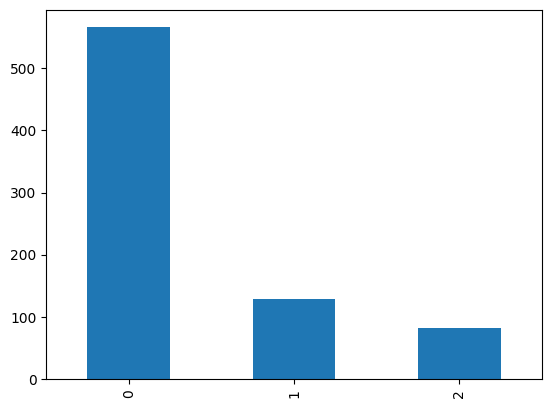

In [25]:
X_km['CLUSTER'].value_counts().plot(kind="bar")
plt.show()

In [26]:
X_km.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,CLUSTER
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,0
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,0
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,0
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,1
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,0


In [27]:
var_cluster = X_km.set_index('CLUSTER').columns.tolist()

fig = px.parallel_coordinates(X_km[var_cluster + ['CLUSTER']], color="CLUSTER",
                              labels={'Apps':'Apps',
                                      'Accept':'Accept',
                                      'Enroll':'Enroll',
                                      'Top10perc':'Top10perc',
                                      'Top25perc': 'Top25perc',
                                      'F.Undergrad':'F.Undergrad',
                                      'P.Undergrad':'P.Undergrad',
                                      'Outstate':'Outstate',
                                      'Room.Board':'Room.Board',
                                      'Books':'Books',
                                      'Personal':'Personal',
                                      'PhD':'PhD',
                                      'Terminal':'Terminal',
                                      'S.F.Ratio':'S.F.Ratio',
                                      'perc.alumni':'perc.alumni',
                                      'Expend':'Expend',
                                      'Grad.Rate':'Grad.Rate'})

fig.update_layout(title={'text': "Cluster analysis", 'y':1}, height=500, width=1500)
fig.show()

<p align="justify">
Acima, estão expostas a distribução de cada amostra em seu cluster para todos os atributos

In [28]:
analise_grupo_mean = X_km.groupby(['CLUSTER'])[var_cluster].mean().reset_index()

fig = px.parallel_coordinates(analise_grupo_mean[var_cluster + ['CLUSTER']],
                              color="CLUSTER",
                              labels={'Apps':'Apps',
                                      'Accept':'Accept',
                                      'Enroll':'Enroll',
                                      'Top10perc':'Top10perc',
                                      'Top25perc': 'Top25perc',
                                      'F.Undergrad':'F.Undergrad',
                                      'P.Undergrad':'P.Undergrad',
                                      'Outstate':'Outstate',
                                      'Room.Board':'Room.Board',
                                      'Books':'Books',
                                      'Personal':'Personal',
                                      'PhD':'PhD',
                                      'Terminal':'Terminal',
                                      'S.F.Ratio':'S.F.Ratio',
                                      'perc.alumni':'perc.alumni',
                                      'Expend':'Expend',
                                      'Grad.Rate':'Grad.Rate'})

fig.update_layout(title={'text': "Cluster analysis", 'y':1}, height=500, width=1500)
fig.show()

<p align="justify">
Acima, estão expostas a média de cada amostra em seu cluster para todos os atributos

> <p align="justify"> Cluster 0 -> Valor baixo para quase tudo e uma taxa média de alunos/professor e gastos pessoais médios

> <p align="justify"> Cluster 1 -> Baixa aceitação, baixo número de estudantes de tempo integral e meio período, alto número de professores com PHD e com grau terminal, custo alto por aluno e alta taxa de graduação

> <p align="justify"> Cluster 2 -> Alta aceitação, aplicação e inscrição, número alto de estudantes, custo baixo com quarto e alto com livros e pessoais, alta taxa de estudantes por aluno, taxa baixa de graduação e alta relação aluno/professor

In [46]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("Grad.Rate X Expend", "Apps X Accept", "Room.Board X Expend"))

# Scatter plot 1
scatter1 = px.scatter(X_km, x="Grad.Rate", y="Expend", color='CLUSTER')
scatter1.update_traces(marker=dict(size=10, opacity=0.8))

# Scatter plot 2
scatter2 = px.scatter(X_km, x="Apps", y="Accept", color='CLUSTER')
scatter2.update_traces(marker=dict(size=10, opacity=0.8))

# Scatter plot 3
scatter3 = px.scatter(X_km, x="Room.Board", y="Expend", color='CLUSTER')
scatter3.update_traces(marker=dict(size=10, opacity=0.8))

fig.add_trace(scatter1['data'][0], row=1, col=1)
fig.add_trace(scatter2['data'][0], row=1, col=2)
fig.add_trace(scatter3['data'][0], row=1, col=3)

fig.update_layout(showlegend=False, height=600, width=1200)

fig.show()

<p align="justify">
Acima temos um scatter plot de como o modelo determinou os clusters em relação e alguns atributos (que foram mostrados anteriormente, na exploração de dados).



---



### KMedoids

<p align="justify">
sklearn_extra.cluster.KMedoids(n_clusters=8, metric='euclidean', method='alternate', init='heuristic', max_iter=300, random_state=None)

In [30]:
kmedoids_0 = KMedoids(random_state=9)
kmedoids_0.fit(X)

kmedoids_0.labels_

array([5, 2, 1, 6, 7, 0, 0, 0, 0, 7, 0, 6, 3, 0, 3, 3, 6, 3, 7, 5, 6, 4,
       3, 4, 7, 5, 1, 4, 1, 0, 3, 1, 3, 3, 1, 7, 6, 6, 1, 4, 0, 3, 3, 3,
       6, 5, 3, 6, 2, 7, 3, 7, 3, 5, 1, 7, 5, 3, 7, 4, 6, 4, 6, 2, 6, 3,
       5, 7, 1, 4, 6, 6, 6, 0, 0, 1, 3, 0, 4, 4, 1, 5, 3, 1, 0, 7, 6, 6,
       1, 3, 0, 6, 3, 7, 2, 3, 0, 3, 1, 7, 1, 1, 5, 5, 5, 3, 0, 6, 6, 1,
       7, 7, 3, 5, 6, 6, 1, 2, 4, 3, 0, 7, 6, 6, 1, 5, 3, 1, 0, 1, 0, 1,
       1, 3, 1, 3, 1, 6, 2, 6, 6, 4, 3, 1, 6, 3, 3, 1, 3, 6, 0, 0, 6, 3,
       3, 3, 7, 1, 6, 6, 1, 5, 6, 0, 6, 5, 5, 3, 3, 3, 7, 2, 6, 7, 6, 6,
       4, 5, 5, 1, 5, 4, 7, 3, 6, 0, 0, 1, 5, 5, 3, 6, 5, 3, 7, 5, 2, 5,
       3, 5, 0, 5, 3, 4, 3, 2, 5, 5, 3, 7, 2, 5, 7, 2, 1, 3, 3, 0, 4, 2,
       3, 6, 4, 5, 3, 6, 3, 0, 0, 7, 6, 7, 3, 5, 3, 3, 1, 6, 5, 0, 0, 1,
       6, 0, 0, 5, 7, 3, 5, 6, 6, 6, 3, 7, 7, 0, 6, 2, 6, 0, 0, 7, 3, 7,
       7, 3, 1, 3, 6, 4, 0, 3, 3, 4, 4, 3, 2, 4, 2, 4, 5, 5, 3, 1, 6, 3,
       3, 0, 4, 3, 5, 3, 6, 3, 1, 7, 6, 3, 0, 6, 7,

#### Definindo K

<p align="justify">
Escolheremos parâmetros arbitrários (n_clusters=k, init='random', random_state=9) para defnir a quantidade de clusters mais apropiada.

In [31]:
wcss = {}
silhouette = {}
ch_score = {}
db_score = {}
bic_score = {}

for k in range(1, 26):
  print(k, end='')
  kmedoids = KMedoids(n_clusters=k, init='random', random_state=9)
  kmedoids.fit(X)

  wcss[k] = kmedoids.inertia_
  #----------------------------------------#
  if k != 1:
    silhouette[k] = silhouette_score(X, kmedoids.labels_, metric='euclidean')
  #----------------------------------------#
    ch_score[k] = calinski_harabasz_score(X, kmedoids.labels_)
  #----------------------------------------#
    db_score[k] = davies_bouldin_score(X, kmedoids.labels_)
  #----------------------------------------#
  distortion = sum(np.min(cdist(X, kmedoids.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0]
  bic_score[k] = X.shape[0] * np.log(distortion) + k * np.log(X.shape[0])
#------------------------------------------------------------------------------#

12345678910111213141516171819202122232425

In [32]:
fig = make_subplots(rows=1, cols=1, subplot_titles=['Método do Cotovelo'],
                    shared_xaxes=True,
                    shared_yaxes=False)

fig.add_trace(go.Scatter(x=list(wcss.keys()),
                         y=list(wcss.values()),
                         mode='lines+markers',
                         textposition='top center',
                         showlegend=False), row=1, col=1)

fig.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig.update_yaxes(visible=True, title='Cluster Inertia',row=1, col=1)

fig.update_layout(title='Definição do Nº Ideal de Clusters',
                  showlegend=False,
                  xaxis_showticklabels=True,
                  height=400,
                  width=800,
                  xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))

fig.show()

In [33]:
fig2 = make_subplots(rows=1, cols=1,
                     subplot_titles=['Método do Silhueta'],
                     shared_xaxes=True,
                     shared_yaxes=False)

fig2.add_trace(go.Scatter(x=list(silhouette.keys()),
                          y=list(silhouette.values()),
                          mode='lines+markers',
                          textposition='top center',
                          showlegend=False), row=1, col=1)

fig2.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig2.update_yaxes(visible=True, title='Cluster Silhouette',row=1, col=1)

fig2.update_layout(showlegend=False,
                   xaxis_showticklabels=True,
                   height=400,
                   width=800,
                   xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))

fig2.show()

In [34]:
fig3 = make_subplots(rows=1, cols=1,
                     subplot_titles=['Método Calinski-Harabasz'],
                     shared_xaxes=True,
                     shared_yaxes=False)

fig3.add_trace(go.Scatter(x=list(ch_score.keys()),
                         y=list(ch_score.values()),
                         mode='lines+markers',
                         textposition='top center',
                         showlegend=False), row=1, col=1)

fig3.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig3.update_yaxes(visible=True, title='Variance Ratio',row=1, col=1)

fig3.update_layout(showlegend=False,
                   xaxis_showticklabels=True,
                   height=400,
                   width=800,
                   xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))

fig3.show()

In [35]:
fig4 = make_subplots(rows=1, cols=1,
                     subplot_titles=['Método Davies-Bouldin'],
                     shared_xaxes=True,
                     shared_yaxes=False)

fig4.add_trace(go.Scatter(x=list(db_score.keys()),
                         y=list(db_score.values()),
                         mode='lines+markers',
                         textposition='top center',
                         showlegend=False), row=1, col=1)

fig4.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig4.update_yaxes(visible=True, title='Average Similarity',row=1, col=1)

fig4.update_layout(showlegend=False,
                   xaxis_showticklabels=True,
                   height=400,
                   width=800,
                   xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))

fig4.show()

In [36]:
fig5 = make_subplots(rows=1, cols=1,
                     subplot_titles=['Método BIC'],
                     shared_xaxes=True,
                     shared_yaxes=False)

fig5.add_trace(go.Scatter(x=list(bic_score.keys()),
                         y=list(bic_score.values()),
                         mode='lines+markers',
                         textposition='top center',
                         showlegend=False), row=1, col=1)

fig5.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig5.update_yaxes(visible=True, title='BIC',row=1, col=1)

fig5.update_layout(showlegend=False,
                   xaxis_showticklabels=True,
                   height=400,
                   width=800,
                   xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))

fig5.show()

<p align="justify">
Após uma análise semelhante à feita para o KMeans, está muito evidente que o modelo com três cluesters é mais vantajoso que os demais.

In [37]:
X_kd = X.copy() # Utilizando o modelo e escolhendo numero de cluster

clus_kd = KMedoids(n_clusters=3, init='random', random_state=9)
clus_kd.fit(X_kd)

X_kd.loc[:, 'CLUSTER'] = clus_kd.labels_
X_kd.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,CLUSTER
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,1
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,2
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,1
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,2
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,1


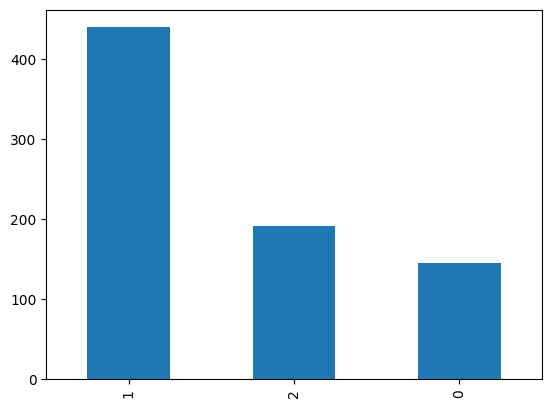

In [38]:
X_kd['CLUSTER'].value_counts().plot(kind="bar")
plt.show()

In [39]:
X_kd.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,CLUSTER
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,1
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,2
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,1
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,2
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,1


In [40]:
var_cluster = X_kd.set_index('CLUSTER').columns.tolist()

fig = px.parallel_coordinates(X_kd[var_cluster + ['CLUSTER']], color="CLUSTER",
                              labels={'Apps':'Apps',
                                      'Accept':'Accept',
                                      'Enroll':'Enroll',
                                      'Top10perc':'Top10perc',
                                      'Top25perc': 'Top25perc',
                                      'F.Undergrad':'F.Undergrad',
                                      'P.Undergrad':'P.Undergrad',
                                      'Outstate':'Outstate',
                                      'Room.Board':'Room.Board',
                                      'Books':'Books',
                                      'Personal':'Personal',
                                      'PhD':'PhD',
                                      'Terminal':'Terminal',
                                      'S.F.Ratio':'S.F.Ratio',
                                      'perc.alumni':'perc.alumni',
                                      'Expend':'Expend',
                                      'Grad.Rate':'Grad.Rate'})

fig.update_layout(title={'text': "Cluster analysis", 'y':1 }, height=500, width=1500)
fig.show()

<p align="justify">
Acima, estão expostas a distribução de cada amostra em seu cluster para todos os atributos

In [41]:
analise_grupo_mean = X_kd.groupby(['CLUSTER'])[var_cluster].mean().reset_index()

fig = px.parallel_coordinates(analise_grupo_mean[var_cluster + ['CLUSTER']],
                              color="CLUSTER",
                              labels={'Apps':'Apps',
                                      'Accept':'Accept',
                                      'Enroll':'Enroll',
                                      'Top10perc':'Top10perc',
                                      'Top25perc': 'Top25perc',
                                      'F.Undergrad':'F.Undergrad',
                                      'P.Undergrad':'P.Undergrad',
                                      'Outstate':'Outstate',
                                      'Room.Board':'Room.Board',
                                      'Books':'Books',
                                      'Personal':'Personal',
                                      'PhD':'PhD',
                                      'Terminal':'Terminal',
                                      'S.F.Ratio':'S.F.Ratio',
                                      'perc.alumni':'perc.alumni',
                                      'Expend':'Expend',
                                      'Grad.Rate':'Grad.Rate'})

fig.update_layout(title={'text': "Cluster analysis", 'y':1}, height=500, width=1500)
fig.show()

<p align="justify">
Acima, estão expostas a média de cada amostra em seu cluster para todos os atributos

> <p align="justify"> Cluster 0 -> Taxa alta de aceitação, aplicação e inscrição, muitos alunos de graduação em período integral e meio período, custo baixo com quarto, alta taxa aluno/professor, custo baixo institucional e taxa baixa de graduação

> <p align="justify"> Cluster 1 -> Taxa baixa em quase tudo, taxa média de aluno/professor

> <p align="justify"> Cluster 2 -> Aceitação média, 10perc e 25perc altos, custo alto com livros, alto custo com quartos, alta taxa de professores com phd

In [47]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("Grad.Rate X Expend", "Apps X Accept", "Room.Board X Expend"))

# Scatter plot 1
scatter1 = px.scatter(X_kd, x="Grad.Rate", y="Expend", color='CLUSTER')
scatter1.update_traces(marker=dict(size=10, opacity=0.8))

# Scatter plot 2
scatter2 = px.scatter(X_kd, x="Apps", y="Accept", color='CLUSTER')
scatter2.update_traces(marker=dict(size=10, opacity=0.8))

# Scatter plot 3
scatter3 = px.scatter(X_kd, x="Room.Board", y="Expend", color='CLUSTER')
scatter3.update_traces(marker=dict(size=10, opacity=0.8))

fig.add_trace(scatter1['data'][0], row=1, col=1)
fig.add_trace(scatter2['data'][0], row=1, col=2)
fig.add_trace(scatter3['data'][0], row=1, col=3)

fig.update_layout(showlegend=False, height=600, width=1200)

fig.show()

<p align="justify">
Acima temos um scatter plot de como o modelo determinou os clusters em relação e alguns atributos (que foram mostrados anteriormente, na exploração de dados).


---

---

Abaixo, está apenas uma visualização do quanto o modelo acertaria (caso o aprendizado fosse supervisionado).

In [43]:
# Para KMeans
kmeans_confusion_matrix = confusion_matrix(y, clus_km.labels_)

# Para KMedoids
kmedoids_confusion_matrix = confusion_matrix(y, clus_kd.labels_)

print("Matriz de Confusão para KMeans:")
print(kmeans_confusion_matrix)

print("\nMatriz de Confusão para KMedoids:")
print(kmedoids_confusion_matrix)

Matriz de Confusão para KMeans:
[[135   1  76]
 [430 128   7]
 [  0   0   0]]

Matriz de Confusão para KMedoids:
[[133  76   3]
 [ 12 364 189]
 [  0   0   0]]


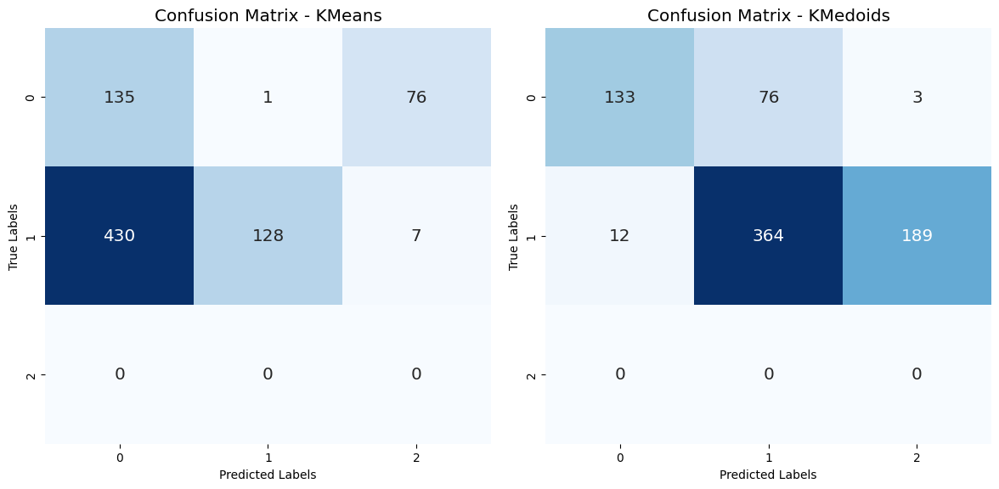

In [44]:
# Função para criar a matriz de confusão estilizada
def plot_confusion_matrix(conf_matrix, title, ax):
    sns.set(font_scale=1.2)
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, ax=ax)
    ax.set_xlabel('Predicted Labels')
    ax.set_ylabel('True Labels')
    ax.set_title(title)

# Crie uma figura com dois subplots lado a lado
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot para KMeans
plot_confusion_matrix(kmeans_confusion_matrix, title='Confusion Matrix - KMeans', ax=axes[0])

# Plot para KMedoids
plot_confusion_matrix(kmedoids_confusion_matrix, title='Confusion Matrix - KMedoids', ax=axes[1])

plt.tight_layout()
plt.show()

## Conclusões

<p align="justify">
Em suma, este trabalho fornece uma introdução sólida à clusterização de dados não supervisionada e demonstrou a aplicação dos algoritmos K-Means e K-Medoids em um contexto do mundo real. Os resultados obtidos podem ser úteis para auxiliar na compreensão e tomada de decisões relacionadas a universidades americanas e podem servir como base para estudos futuros.

<p align="justify">
É evidente que, apesar do problema original possuir apenas duas classes para serem decididas, o modelo com três clusters mostrou-se mais vantajoso. Isso pode ter se dado devido á grande relação entre as classes alvo, impossibilitando que uma fronteira evidente pudesse ser feita apenas com dois clusters.

### Fontes

https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

https://scikit-learn-extra.readthedocs.io/en/stable/generated/sklearn_extra.cluster.KMedoids.html

https://towardsdatascience.com/a-practical-guide-on-k-means-clustering-ca3bef3c853d